In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import polars as pl
import seaborn as sns

from sentence_transformers import SentenceTransformer, util
from sklearn.metrics.pairwise import cosine_similarity

/Users/ali.septiandri/miniforge3/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# AII

In [2]:
keywords = [
    'machine learning',
    'deep learning',
    'artificial intelligence',
    'reinforcement learning',
    'neural network',
    # 'image recognition',
    'computer vision',
    'natural language processing',
    # 'model training',
    # 'inference',
    # 'hyperparameter',
    'speech processing',
    'control methods',
    'knowledge representation',
    'planning',
    'predictive analytics',
    'robotics',
]

In [3]:
patents = pd.read_csv('datasets/ai_patents.csv').drop('index', axis=1)
patents['year'] = patents['publication_date'].astype(str).str[:4].astype(int)
patents.head()

,publication_number,application_number,publication_date,title,abstract,code,year
0,US-8756170-B2,US-201113115400-A,20140617,Regular expression matching method and system,The present invention discloses a regex matchi...,G06N99/005,2014
1,US-2016364537-A1,US-201514740255-A,20161215,Diagnostic support systems using machine learn...,Systems for diagnostic decision support utiliz...,A61B5/7267,2016
2,US-2017103055-A1,US-201615362590-A,20170413,Patent drafting system,Systems and methods are disclosed to analyze a...,G06F17/27,2017
3,US-2017166204-A1,US-201615240504-A,20170615,Method and apparatus for controlling path of a...,A method for controlling a path of an autonomo...,G05D1/0088,2017
4,US-2017168485-A1,US-201514968848-A,20170615,System and Method for Controlling Autonomous V...,A method determines iteratively a motion of th...,G05D1/0088,2017


In [4]:
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer(lowercase=True, ngram_range=(1, 3), vocabulary=keywords, binary=True)
# X = vec.fit_transform(patents[patents['year'].ge(2015) & patents['year'].le(2020)].abstract.values)
X = vec.fit_transform(patents.abstract.values)

In [5]:
total = pd.DataFrame({
    'keywords': keywords,
    'freq': np.array(X.sum(axis=0)).flatten()
})
print(
    total.set_index('keywords')
    .sort_values('freq', ascending=False)
    .style.to_latex()
)

\begin{tabular}{lr}
 & freq \\
keywords &  \\
machine learning & 10904 \\
neural network & 9364 \\
artificial intelligence & 2674 \\
deep learning & 1848 \\
planning & 1050 \\
natural language processing & 917 \\
reinforcement learning & 506 \\
computer vision & 463 \\
speech processing & 126 \\
predictive analytics & 69 \\
robotics & 64 \\
control methods & 29 \\
knowledge representation & 24 \\
\end{tabular}



In [6]:
(X.sum(axis=1) != 0).sum(axis=0)

matrix([[25283]])

In [7]:
# model = SentenceTransformer('sentence-transformers/sentence-t5-xl')

In [8]:
# pool = model.start_multi_process_pool()
# abstract_embeddings = model.encode_multi_process(patents.abstract.values, pool)
# model.stop_multi_process_pool(pool)
# np.save('datasets/abstract_embeddings_t5-xl.npy')

In [9]:
patent_mask = (np.array(X.sum(axis=1)) != 0).flatten()
patents = patents[patent_mask].reset_index(drop=True).copy()

In [10]:
abstract_embeddings = np.load('datasets/abstract_embeddings_t5-xl.npy')
abstract_embeddings = abstract_embeddings[patent_mask].copy()

In [11]:
assert patents.shape[0] == abstract_embeddings.shape[0]

In [12]:
cai = pd.read_excel('datasets/Alphabetical-Index-of-Occupations-December-2019_Final.xlsx', skiprows=6)
# cai_embeddings = model.encode(cai['Description'].values)
# np.save('datasets/cai_embeddings.npy', cai_embeddings)
cai_embeddings = np.load('datasets/cai_embeddings.npy')

/Users/ali.septiandri/miniforge3/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Conditional Formatting extension is not supported and will be removed
  warn(msg)


In [13]:
similarity = util.cos_sim(
    cai_embeddings,
    abstract_embeddings[patents[patents['year'].ge(2015) & patents['year'].le(2022)].index]
)

In [14]:
cai['closest_patent'] = similarity.max(axis=1).indices.numpy()
cai['similarity'] = similarity.max(axis=1).values.numpy()
cai['s'] = cai['similarity'].gt(cai['similarity'].quantile(.90))

In [15]:
filtered_patents = patents[patents['year'].ge(2015) & patents['year'].le(2022)].reset_index(drop=True)
patent_map = filtered_patents.title.to_dict()

In [29]:
augmentation = cai.groupby('2018 SOC Code').agg({
    's': ['mean', 'count']
}).reset_index()
augmentation.columns = ['SOC Code', 'aii', 'total_tasks']

In [46]:
# augmentation.to_csv('datasets/2022/augmentation.csv', index=False)

In [30]:
print(f"Micro titles: {similarity.shape[0]:,.0f}")
print(f"Patents: {similarity.shape[1]:,.0f}")

Micro titles: 32,953
Patents: 24,758


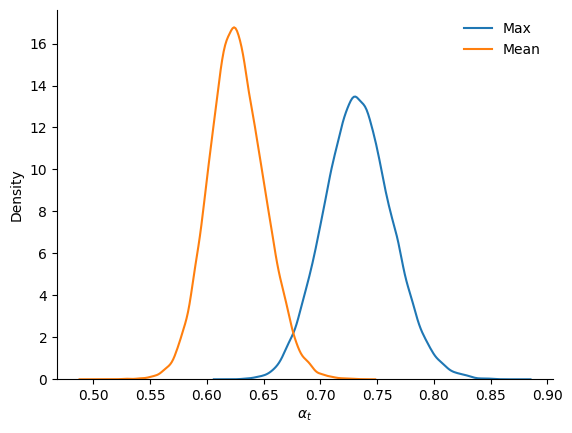

In [31]:
sns.kdeplot(x=similarity.max(axis=1).values.numpy())
sns.kdeplot(x=similarity.mean(axis=1).numpy())
# sns.histplot(x=similarity.flatten(), bins=30, alpha=.5, stat='density')
plt.legend(['Max', 'Mean'], frameon=False)
plt.xlabel('$\\alpha_t$')
sns.despine()
plt.savefig('figures/2022/aug-similarity-dist.pdf', bbox_inches='tight')

In [32]:
data = pd.read_csv('datasets/2022/aii.csv')
data = pd.merge(
    augmentation,
    data,
    how='inner',
    on='SOC Code',
    suffixes=('', '_auto')
)

In [33]:
pd.DataFrame({
    'Highest scoring': data.nlargest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
    'Lowest scoring': data.nsmallest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
})

,Highest scoring,Lowest scoring
0,Magnetic Resonance Imaging Technologists,Human Resources Specialists
1,Hearing Aid Specialists,Credit Counselors
2,"Electrical and Electronics Repairers, Commerci...",Agricultural Technicians
3,Electromechanical Equipment Assemblers,"Special Education Teachers, Secondary School"
4,Computer Numerically Controlled Tool Operators,Adapted Physical Education Specialists
5,Electrical and Electronic Equipment Assemblers,Art Directors
6,Fabric and Apparel Patternmakers,"Fine Artists, Including Painters, Sculptors, a..."
7,Computer Numerically Controlled Tool Programmers,"Dentists, General"
8,Cardiovascular Technologists and Technicians,Surgical Assistants
9,Wind Turbine Service Technicians,Speech-Language Pathology Assistants


In [34]:
# Table 1
print(pd.DataFrame({
    'Highest scoring': data.nlargest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
    'Lowest scoring': data.nsmallest(20, ['aii', 'total_tasks'])['Title'].reset_index(drop=True),
}).style.to_latex())

\begin{tabular}{lll}
 & Highest scoring & Lowest scoring \\
0 & Magnetic Resonance Imaging Technologists & Human Resources Specialists \\
1 & Hearing Aid Specialists & Credit Counselors \\
2 & Electrical and Electronics Repairers, Commercial and Industrial Equipment & Agricultural Technicians \\
3 & Electromechanical Equipment Assemblers & Special Education Teachers, Secondary School \\
4 & Computer Numerically Controlled Tool Operators & Adapted Physical Education Specialists \\
5 & Electrical and Electronic Equipment Assemblers & Art Directors \\
6 & Fabric and Apparel Patternmakers & Fine Artists, Including Painters, Sculptors, and Illustrators \\
7 & Computer Numerically Controlled Tool Programmers & Dentists, General \\
8 & Cardiovascular Technologists and Technicians & Surgical Assistants \\
9 & Wind Turbine Service Technicians & Speech-Language Pathology Assistants \\
10 & Diagnostic Medical Sonographers & Security Guards \\
11 & Cartographers and Photogrammetrists & Sales Repre

In [35]:
pd.options.display.max_colwidth = 100

# Trends

In [36]:
occupations = pl.read_csv('datasets/db_26_3_text/Occupation Level Metadata.txt', separator='\t')

In [37]:
def compute_scores(cai_embeddings, abstract_embeddings, cai, aii):
    similarity = cosine_similarity(
        cai_embeddings,
        abstract_embeddings
    )

    cc = cai.copy()
    cc['similarity'] = similarity.max(axis=1)
    cc['s'] = cc['similarity'].gt(cc['similarity'].quantile(.90))

    augmentation = cc.groupby('2018 SOC Code').agg({
        's': ['mean', 'count']
    }).reset_index()
    augmentation.columns = ['SOC Code', 'aii', 'total_tasks']

    return pd.merge(
        augmentation,
        aii[['SOC Code', 'Title']],
        how='inner',
        on='SOC Code',
        suffixes=('', '_auto')
    )

In [54]:
df = pd.DataFrame()
for year in range(2015, 2023):
    temp_df = compute_scores(
        cai_embeddings,
        abstract_embeddings[patents.query('2015 <= year <= @year').index],
        cai,
        data
    )
    temp_df['year'] = year
    df = pd.concat([df, temp_df], ignore_index=True)

In [56]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

trends = []
for code, group in df.groupby('SOC Code'):
    reg = LinearRegression()
    support = np.arange(len(group)).reshape(-1, 1)
    y = group['aii']
    reg.fit(support, y)
    y_pred = reg.predict(support)
    r2 = r2_score(y, y_pred)
    trends.append({
        'SOC Code': code,
        'slope': reg.coef_[0],
        'difference': group['aii'].max() - group['aii'].min(),
        'aii': group['aii'].max(),
        'r2': r2,
    })
trends = pd.DataFrame(trends)

In [57]:
trends['difference'].describe(percentiles=[0.25, 0.5, 0.75, 0.9])

count    658.000000
mean       0.118121
std        0.161324
min        0.000000
25%        0.000000
50%        0.062500
75%        0.166667
90%        0.333333
max        1.000000
Name: difference, dtype: float64

In [58]:
t = trends.query('difference != 0').difference.median()
trends['group'] = np.select(
    [trends['difference'] == 0, trends['difference'] <= t],
    [0, 1],
    2
)

# trends['group'] = pd.qcut(trends['difference'], 3).cat.codes

In [60]:
p_threshold = .90
threshold = cai['similarity'].quantile(p_threshold)

def find_most_disrupted_tasks(task_embeddings, abstract_embeddings, tasks, patents):
    assert task_embeddings.shape[0] == tasks.shape[0]
    assert abstract_embeddings.shape[0] == patents.shape[0]

    similarity = cosine_similarity(
        task_embeddings,
        abstract_embeddings
    )

    task_df = tasks.copy()

    patent_map = patents.abstract.reset_index(drop=True).to_dict()
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    task_df['s'] = task_df['similarity'].gt(threshold).astype(int)
    task_df['similarity_t'] = task_df['similarity'] * task_df['s']
    task_df['closest_patent'] = task_df['patent_index'].map(patent_map)
    return task_df

In [198]:
cai['SOC Code'] = cai['2018 SOC Code']

In [242]:
disrupted_tasks = pd.DataFrame()
job_ids = data.nlargest(20, ['aii', 'total_tasks'])['SOC Code'].tolist()

for year in range(2015, 2023):
    # soc_codes = bumps[bumps['year'].eq(year)]['SOC Code'].values
    # task_ids = tasks[tasks['SOC Code'].isin(soc_codes)].index.values
    task_ids = cai[cai['SOC Code'].isin(job_ids)].index.values
    patent_ids = patents[patents['year'].ge(2015) & patents['year'].le(year)].index.values

    disrupted_tasks = pd.concat([
        disrupted_tasks,
        (
            pl.from_dataframe(
                find_most_disrupted_tasks(
                    cai_embeddings[task_ids],
                    abstract_embeddings[patent_ids],
                    cai.loc[task_ids],
                    patents.loc[patent_ids],
                )
            )
            .filter(pl.col('s').eq(1))
            .select(
                'SOC Code',
                pl.col('Description').alias('task'),
                pl.col('closest_patent').alias('patent'),
                'similarity',
                's',
                pl.lit(year, dtype=int).alias('year')
            )
            .to_pandas()
        )
    ], ignore_index=True)

In [243]:
sector_map = {
    '29-2035': 'Health care and social assistance',
    '29-2092': 'Health care and social assistance',
    '29-2034': 'Health care and social assistance',
    '29-2057': 'Health care and social assistance',
    '29-1181': 'Health care and social assistance',
    '17-3012': 'Professional, Scientific and Technical Services',
}

job_sectors = (
    occupations
    .filter(pl.col('Item').eq('NAICS Sector'))
    .filter(pl.col('Percent').ne('n/a'))
    .filter(pl.col('Percent').cast(float).ge(50))
    .with_columns(
        pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code')
    )
    .filter(pl.col('SOC Code').is_in(disrupted_tasks['SOC Code'].unique().tolist()))
    .join(pl.from_dataframe(data), on='SOC Code')
    .select(
        'SOC Code',
        pl.col('Response').alias('sector'),
    )
    .to_pandas()
)

job_sectors = data.nlargest(20, 'aii').merge(
    job_sectors,
    how='left',
    on='SOC Code'
)

job_sectors['sector'] = job_sectors['sector'].fillna(job_sectors['SOC Code'].map(sector_map))
job_sectors.loc[job_sectors['SOC Code'].eq('49-9081'), 'sector'] = 'Professional, Scientific and Technical Services'
job_sectors.loc[job_sectors['SOC Code'].eq('43-9031'), 'sector'] = 'Professional, Scientific and Technical Services'

In [245]:
short_title_map = {
    'Magnetic Resonance Imaging Technologists': 'Magnetic Resonance Imaging Technologists',
    'Hearing Aid Specialists': 'Hearing Aid Specialists',
    'Electrical and Electronics Repairers, Commercial and Industrial Equipment': 'Electrical Repairers',
    'Electrical and Electronic Equipment Assemblers': 'Electrical Equipment Assemblers',
    'Electromechanical Equipment Assemblers': 'Electromechanical Equipment Assemblers',
    'Fabric and Apparel Patternmakers': 'Fabric and Apparel Patternmakers',
    'Computer Numerically Controlled Tool Operators': 'Computer Numerically Controlled Tool Operators',
    'Computer Numerically Controlled Tool Programmers': 'Computer Numerically Controlled Tool Programmers',
    'Cardiovascular Technologists and Technicians': 'Cardiovascular Technologists and Technicians',
    'Wind Turbine Service Technicians': 'Wind Turbine Service Technicians',
    'Diagnostic Medical Sonographers': 'Diagnostic Medical Sonographers',
    'Cartographers and Photogrammetrists': 'Cartographers and Photogrammetrists',
    'Food Science Technicians': 'Food Science Technicians',
    'Orthodontists': 'Orthodontists',
    'Prosthodontists': 'Prosthodontists',
    'Radiologic Technologists and Technicians': 'Radiologic Technologists and Technicians',
    'Electrical and Electronics Drafters': 'Electrical and Electronics Drafters',
    'Audiologists': 'Audiologists',
    'Ophthalmic Medical Technicians': 'Ophthalmic Medical Technicians',
    'Desktop Publishers': 'Desktop Publishers',
}

In [246]:
(
    pl.from_dataframe(disrupted_tasks)
    .join(
        pl.from_dataframe(data),
        on='SOC Code'
    )
    .pivot(
        index='year',
        columns='Title',
        values='task',
        aggregate_function='count',
    )
    .fill_null(0)
    .select(pl.all().exclude('year').diff())
)

Cartographers and Photogrammetrists,Electrical and Electronics Drafters,Food Science Technicians,Orthodontists,Prosthodontists,Audiologists,Cardiovascular Technologists and Technicians,Diagnostic Medical Sonographers,Radiologic Technologists and Technicians,Magnetic Resonance Imaging Technologists,Ophthalmic Medical Technicians,Hearing Aid Specialists,Desktop Publishers,"Electrical and Electronics Repairers, Commercial and Industrial Equipment",Wind Turbine Service Technicians,Electrical and Electronic Equipment Assemblers,Electromechanical Equipment Assemblers,Fabric and Apparel Patternmakers,Computer Numerically Controlled Tool Operators,Computer Numerically Controlled Tool Programmers
i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,i64
null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
1,0,0,0,0,3,0,0,1,0,0,0,0,1,0,0,0,0,0,0
-2,-4,-2,0,-2,-4,-13,-13,-7,-2,-3,-2,-3,-2,-7,-1,-2,-1,-2,-1
0,0,0,0,0,0,10,6,0,0,0,0,1,0,5,0,0,0,1,0
0,0,0,0,0,0,0,0,1,2,0,0,0,1,0,0,1,0,0,0
0,1,0,0,1,0,0,3,2,0,0,0,1,0,0,0,1,0,1,1
0,2,0,0,0,0,1,1,1,0,0,1,1,0,2,1,0,0,0,0
0,1,2,0,1,1,1,2,0,0,0,1,0,0,0,0,0,1,0,0


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



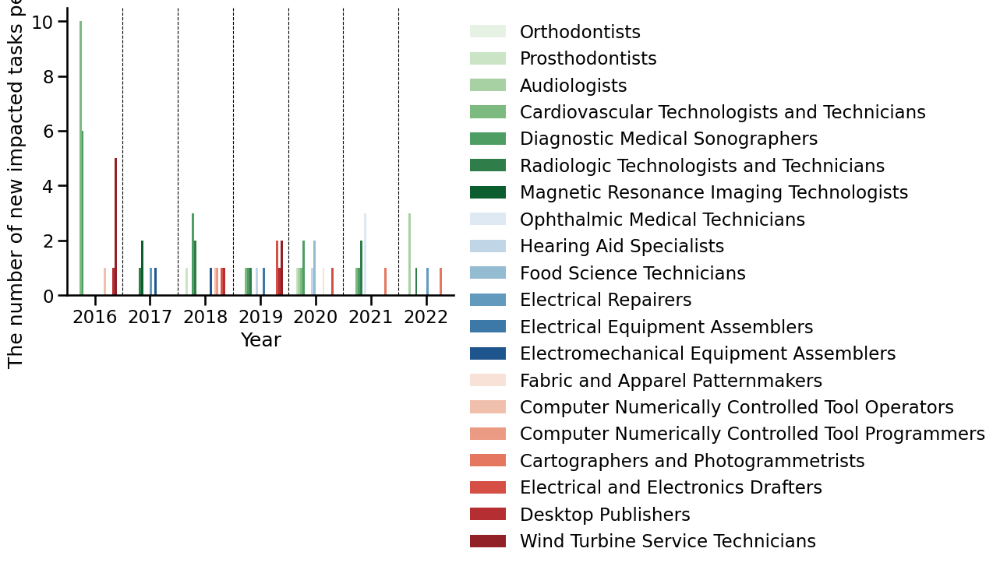

In [247]:
x = disrupted_tasks.pivot_table(
    index='year',
    columns='SOC Code',
    values='task',
    aggfunc='count',
    fill_value=0
)

q = x.diff().iloc[1:].reset_index().melt(id_vars='year').merge(
    job_sectors,
    how='left',
    on='SOC Code'
).sort_values(['sector', 'year'])

sns.barplot(
    x='year',
    y='value',
    hue='short_title',
    data=q.assign(short_title=q['Title'].map(short_title_map)),
    palette=sns.color_palette('Greens', 7) + sns.color_palette('Blues', 6) + sns.color_palette('Reds', 7),
)
for i in np.arange(0.5, 6.5):
    plt.axvline(i, color='k', linestyle='--', linewidth=.8)
plt.legend(bbox_to_anchor=(1, 1), frameon=False)
plt.xlabel('Year')
plt.ylabel('The number of new impacted tasks per year')
sns.despine()

/var/folders/0d/380dd3_d27v3p6p6m6nb230h0000gn/T/ipykernel_26187/970062846.py:9: UserWarning:

Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.



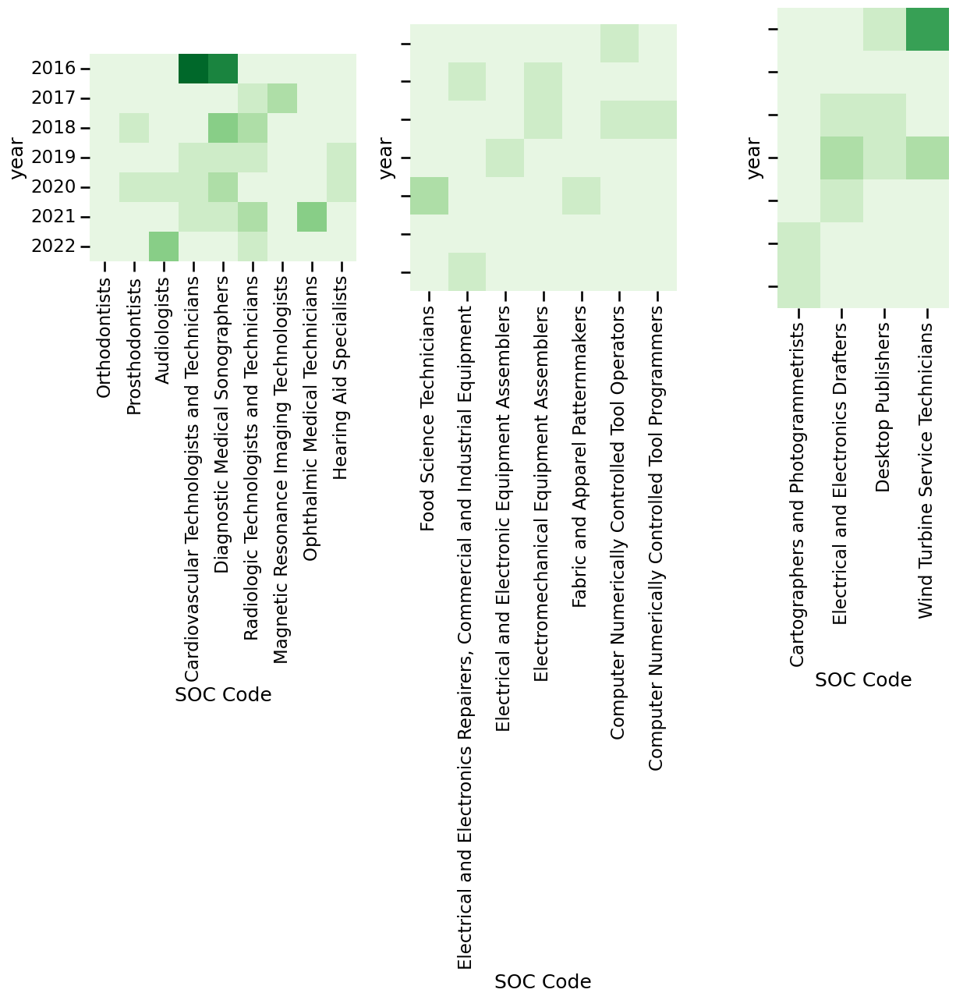

In [249]:
# Figure 2
import textwrap as tw

fig, axes = plt.subplots(ncols=3, sharey=True, figsize=(15, 5))
for ax, (s, group) in zip(axes.flatten(), q.groupby('sector')):
    cols = group['SOC Code'].unique().tolist()
    col_name_dict = group[['SOC Code', 'Title']].drop_duplicates().set_index('SOC Code')['Title'].to_dict()
    sns.heatmap(x[cols].rename(col_name_dict, axis=1).diff().iloc[1:], square=True, vmax=8, cmap=sns.color_palette('Greens', 8), cbar=False, ax=ax)
plt.tight_layout()
plt.savefig('figures/2022/aug-heatmap.pdf', bbox_inches='tight')

In [250]:
dt = disrupted_tasks.drop_duplicates(subset=['SOC Code', 'task'])

In [251]:
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS

stop_words = list(ENGLISH_STOP_WORDS) + ['include', 'includes', 'including', 'method', 'methods', 'using', 'used', 'determine', 'based', 'provided']

v = TfidfVectorizer(ngram_range=(1, 3), max_features=50, stop_words=stop_words)
xx = v.fit_transform(dt.patent.values)
xx = (
    pd.DataFrame(xx.todense(), columns=v.get_feature_names_out())
    .assign(year=dt.year.values)
    .groupby('year')
    .sum()
)

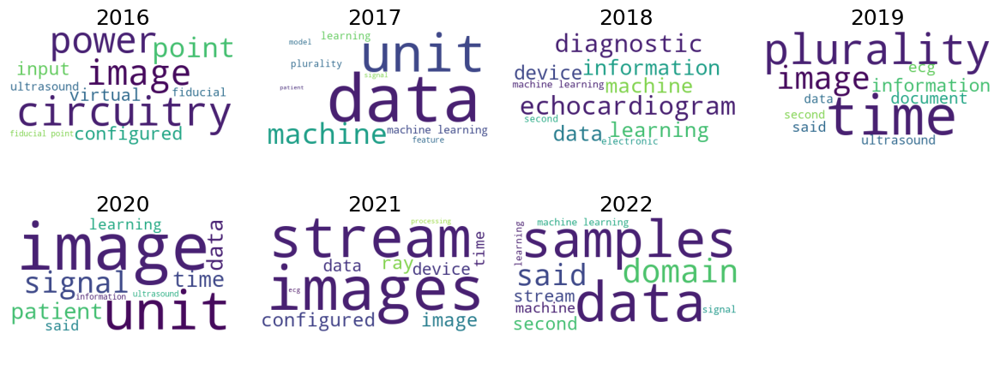

In [252]:
from wordcloud import WordCloud

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 5))
for ax, year in zip(axes.flatten(), range(2016, 2023)):
    wc = WordCloud(background_color="white", random_state=42)
    wc.generate_from_frequencies(xx.T[year].sort_values().tail(10).to_dict())
    ax.imshow(wc)
    ax.set_title(year)
    ax.axis('off')
axes.flatten()[-1].axis('off')
plt.tight_layout()
plt.savefig('figures/2022/aug-wordcloud.pdf', bbox_inches='tight')

# Sectors

In [ ]:
def compute_scores(cai_embeddings, abstract_embeddings, cai, data, threshold=0.8):
    similarity = cosine_similarity(
        cai_embeddings,
        abstract_embeddings
    )

    task_df = cai.copy()

    # threshold = task_df['similarity'].quantile(.95)
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    # task_df['weight'] = task_df['Data Value'] / task_df.groupby('O*NET-SOC Code')['Data Value'].transform('sum')
    # task_df['similarity_t'] = task_df['similarity'] * (task_df['similarity'] > threshold).astype(int)
    # task_df['aii'] = task_df['similarity'] * task_df['weight']
    task_df['aii'] = task_df['similarity'].gt(threshold)

    jobs_aii = pd.merge(
        task_df.groupby('SOC Code').agg({'aii': 'mean'}).reset_index(),
        data,
        how='left',
        on='SOC Code',
        suffixes=('', '_auto')
    )

    return jobs_aii

In [101]:
df_aii = pd.DataFrame()
for year in range(2015, 2023):
    data_aii = compute_scores(
        cai_embeddings,
        abstract_embeddings[patents.query('year <= @year').index],
        cai,
        data,
    )
    data_aii['year'] = year
    df_aii = pd.concat([df_aii, data_aii], ignore_index=True)

In [90]:
from scipy.stats import beta

def compute_industry_scores(occupations, augmentation, year=None):
    data = (
        occupations
        .filter(pl.col('Item') == 'NAICS Sector')
        .filter(pl.col('Percent') != 'n/a')
        .filter(pl.col('Percent').cast(float) > 50)
        .with_columns(pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code'))
        .join(pl.from_dataframe(augmentation), on='SOC Code')
        .filter(pl.col('Percent').cast(float) == pl.col('Percent').cast(float).max().over('SOC Code'))
        .with_columns(
            (pl.col('Percent').cast(float) * pl.col('aii')).alias('score')
        )
        .group_by('Response')
        .agg(
            pl.col('score').sum(),
            pl.col('Percent').cast(float).sum()
        )
        .filter(pl.col('Response') != 'Unclassified')
        .sort('score')
        .to_pandas()
    )

    # Using conservative views and a weakly informative prior
    data['aii'] = beta(
        1 + data['score'],
        9 + data['Percent'] - data['score']
    ).ppf(.25)
    # data['aii'] = data['score'] / data['Percent']
    data['aii_std'] = beta(
        1 + data['score'],
        9 + data['Percent'] - data['score']
    ).std()

    if year:
        data['year'] = year

    return data

In [76]:
sector_name = {
    'Accommodation and food services': 'Accommodation and food services',
    'Administrative and support and waste management and remediation services': 'Waste management',
    'Agriculture, forestry, fishing and hunting': 'Agriculture',
    'Arts, entertainment, and recreation': 'Arts and entertainment',
    'Construction': 'Construction',
    'Education services': 'Education',
    'Finance and insurance': 'Finance and insurance',
    'Health care and social assistance': 'Healthcare',
    'Information': 'Information technology',
    'Manufacturing': 'Manufacturing',
    'Mining': 'Mining',
    'Other services, except public administration': 'Other services',
    'Professional, Scientific and Technical Services': 'Scientific and technical services',
    'Public administration': 'Public administration',
    'Real estate and rental and leasing': 'Real estate',
    'Retail trade': 'Retail trade',
    'Transportation and warehousing': 'Transportation',
    'Utilities': 'Utilities',
    'Wholesale trade': 'Wholesale trade',
}

In [84]:
sectors = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .with_columns(pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code'))
    .filter(pl.col('Percent').cast(float) > 50)
    .join(pl.from_dataframe(data), on='SOC Code')
    .filter(pl.col('Percent').cast(float) == pl.col('Percent').cast(float).max().over('SOC Code'))
    .with_columns(
        pl.col('aii').ne(0).alias('is_impacted')
    )
    .group_by('Response')
    .agg(
        pl.col('is_impacted').sum().truediv(pl.col('is_impacted').count()).alias('fraction'),
        pl.col('is_impacted').count().alias('total_jobs'),
    )
    .filter(pl.col('Response') != 'Unclassified')
    .sort('fraction')
    .to_pandas()
)

In [87]:
soc_sector_map = (
    occupations
    .filter(pl.col('Item') == 'NAICS Sector')
    .filter(pl.col('Percent') != 'n/a')
    .filter(pl.col('Percent').cast(float) > 50)
    .with_columns(pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code'))
    .group_by('SOC Code', 'Response')
    .count()
    .filter(pl.col('count').eq(pl.col('count').max().over('SOC Code')))
    .select('SOC Code', pl.col('Response').alias('Sector'))
)

In [88]:
sns.set_context('talk')

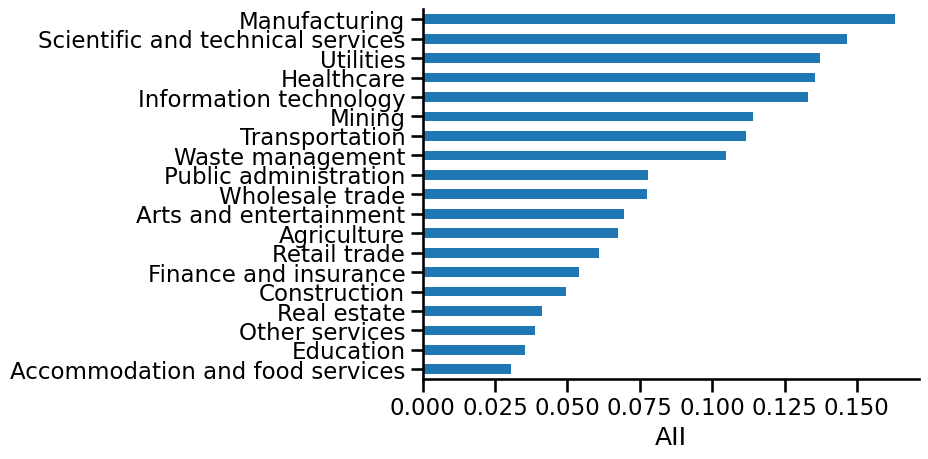

In [91]:
# Fig 3a
industry_scores = compute_industry_scores(occupations, augmentation)
industry_scores.set_index('Response').rename(sector_name).aii.sort_values().plot.barh()
plt.xlabel('AII')
plt.ylabel('')
sns.despine()
plt.savefig('figures/2022/aug-sectors.pdf', bbox_inches='tight')

In [93]:
industry_scores[['Response', 'aii', 'aii_std']].to_csv('datasets/2022/aii_aug_sector.csv', index=False)

In [94]:
patent_map = patents[patents['year'].ge(2015) & patents['year'].le(2022)].title.reset_index(drop=True).to_dict()

In [103]:
df_sectors = pd.DataFrame()
for year, group in df_aii.groupby('year'):
    df_sectors = pd.concat([
        df_sectors,
        compute_industry_scores(occupations, group, year)
    ], ignore_index=True)
df_sectors = df_sectors.rename({'Response': 'sector'}, axis=1)

In [104]:
sector_trends = []
for sector, group in df_sectors.groupby('sector'):
    reg = LinearRegression()
    support = np.arange(len(group)).reshape(-1, 1)
    y = group['aii']
    reg.fit(support, y)
    y_pred = reg.predict(support)
    r2 = r2_score(y, y_pred)
    sector_trends.append({
        'sector': sector,
        'slope': reg.coef_[0],
        'difference': group['aii'].max() - group['aii'].min(),
        'aii': group['aii'].max(),
        'r2': r2,
    })
sector_trends = pd.DataFrame(sector_trends)

In [105]:
# def categorise_sector_trends(sector):
#     if sector['r2'] < 0.96:
#         return 0
#     elif sector['slope'] > 0.014:
#         return 1
#     else:
#         return 2
# 
# sector_trends['group'] = sector_trends.apply(categorise_sector_trends, axis=1)

sector_trends['group'] = pd.qcut(sector_trends['difference'], 3).cat.codes

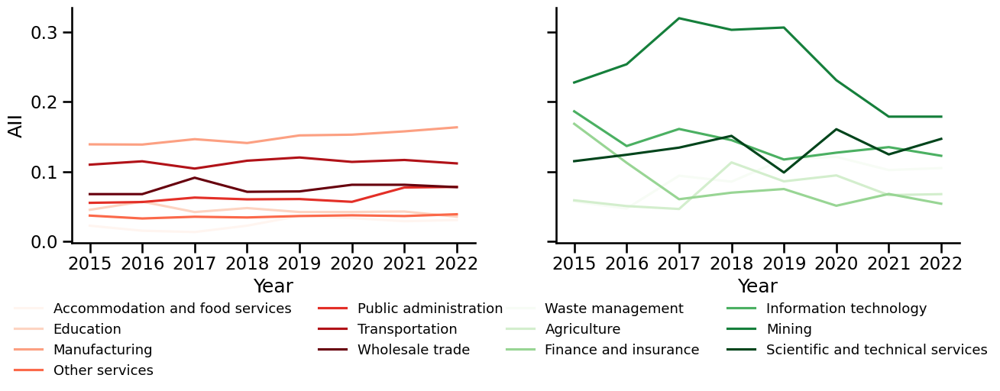

In [106]:
# Figure 3c
fig, axes = plt.subplots(ncols=2, figsize=(15, 4), sharey=True)
for ax, (g, group), c in zip(axes, sector_trends.query('group in [0, 2]').groupby('group'), ['Reds', 'Greens']):
    df_sectors.query('sector in @group.sector').pivot_table(
        index='year',
        columns='sector',
        values='aii'
    ).rename(sector_name, axis=1).plot.line(cmap=c, ax=ax)
    # ax.set_ylim(0.35, 0.65)
    ax.set_xticks(np.arange(2015, 2023))
    ax.set_xlabel('Year')
    ax.set_ylabel('AII')
    ax.legend(bbox_to_anchor=(1.1, -0.2), ncols=2, frameon=False, fontsize=13)
    # plt.tight_layout()
    sns.despine()
plt.savefig('figures/2022/aug-trends-sectors.pdf', bbox_inches='tight')

In [117]:
# sector_job = (
#     occupations
#     .filter(pl.col('Item') == 'NAICS Sector')
#     .filter(pl.col('Percent') != 'n/a')
#     .with_columns(pl.col('O*NET-SOC Code').str.slice(0, 7).alias('SOC Code'))
#     .join(pl.from_dataframe(data), on='SOC Code')
#     # .sort(pl.col('Percent').cast(float)).group_by('Response').tail(68) # Only taking top 10%
#     .filter(pl.col('Percent').cast(float) > 50)
#     .with_columns(
#         (pl.col('Percent').cast(float) * pl.col('aii')).alias('score')
#     )
#     .select(
#         pl.col('Response').alias('sector'),
#         'SOC Code',
#         'Title',
#         # 'Description'
#     )
# )

In [120]:
# for i, rate in enumerate(['low', 'mid', 'high']):
#     (
#         pl.from_dataframe(sector_trends)
#         .filter(pl.col('group').eq(i))
#         .join(sector_job, how='left', on='sector')
#         .select('sector', 'SOC Code', 'Title', 'Description')
#         .join(pl.from_dataframe(tasks), how='left', on='SOC Code')
#         .select('sector', 'SOC Code', 'Title', 'Description', 'Task', 'similarity_t', 'patent_index')
#         .with_columns(pl.col('patent_index').map_dict(patent_map).alias('patent'))
#         .to_pandas()
#         .to_csv(f'datasets/2022_trend_{rate}.csv', index=False)
#     )

# States

In [121]:
df_county = pd.read_csv('datasets/county_naics_2022.csv', dtype={'industry_code': str, 'area_fips': str})
df_county['sector_code'] = df_county['industry_code'].str[:2]
df_county['fips'] = df_county['area_fips'].str[:2]
df_county.head()

,area_fips,own_code,industry_code,agglvl_code,size_code,year,qtr,disclosure_code,annual_avg_estabs,annual_avg_emplvl,...,oty_taxable_annual_wages_chg,oty_taxable_annual_wages_pct_chg,oty_annual_contributions_chg,oty_annual_contributions_pct_chg,oty_annual_avg_wkly_wage_chg,oty_annual_avg_wkly_wage_pct_chg,oty_avg_annual_pay_chg,oty_avg_annual_pay_pct_chg,sector_code,fips
0,01000,0,10,50,0,2022,A,NaN,148979,2026102,...,841800853,5.1,-48478330,-18.1,57,5.5,2951,5.4,10,01
1,01000,1,10,51,0,2022,A,NaN,1257,55220,...,0,0.0,0,0.0,52,3.0,2691,3.0,10,01
2,01000,1,102,52,0,2022,A,NaN,1257,55220,...,0,0.0,0,0.0,52,3.0,2691,3.0,10,01
3,01000,1,1021,53,0,2022,A,NaN,619,11505,...,0,0.0,0,0.0,42,3.1,2172,3.1,10,01
4,01000,1,1022,53,0,2022,A,NaN,2,11,...,0,0.0,0,0.0,19,3.0,978,3.0,10,01


In [123]:
# import requests

geojson = pd.read_json('datasets/geojson-counties-fips.json')

In [125]:
naics_mapping = {
    11: 'Agriculture, forestry, fishing and hunting',
    21: 'Mining',
    22: 'Utilities',
    23: 'Construction',
    31: 'Manufacturing',
    32: 'Manufacturing',
    33: 'Manufacturing',
    42: 'Wholesale trade',
    44: 'Retail trade',
    45: 'Retail trade',
    48: 'Transportation and warehousing',
    49: 'Transporation and warehousing',
    51: 'Information',
    52: 'Finance and insurance',
    53: 'Real estate and rental and leasing',
    54: 'Professional, Scientific, and Technical Services',
    55: 'Management of Companies and Enterprises',
    56: 'Administrative and support and waste management and remediation services',
    61: 'Education services',
    62: 'Health care and social assistance',
    71: 'Arts, entertainment, and recreation',
    72: 'Accommodation and food services',
    81: 'Other services, except public administration',
    92: 'Public administration',
}

In [126]:
county_data = df_county[~df_county['fips'].isin(['72', '78', 'C1', 'C2', 'C3', 'C4', 'US'])].copy()

In [127]:
county_data['sector'] = county_data['sector_code'].astype('int').map(naics_mapping)

In [128]:
state_data = (
    pl.from_dataframe(county_data)
    .filter(pl.col('area_fips').str.ends_with('000'))
    .to_pandas()
)
state_agg = state_data.groupby(['fips', 'sector']).annual_avg_emplvl.sum().reset_index()

county_agg = (
    pl.from_dataframe(county_data)
    .filter(~pl.col('area_fips').str.ends_with('000'))
    .select('area_fips', 'fips', 'sector', 'annual_avg_emplvl')
    .drop_nulls()
    .group_by(['area_fips', 'fips', 'sector'])
    .agg(pl.col('annual_avg_emplvl').sum())
    .to_pandas()
)
# county_agg = state_data[['area_fips', 'fips', 'sector', 'annual_avg_emplvl']].dropna().groupby(['area_fips', 'fips', 'sector']).sum().reset_index()

In [129]:
state_fips = pd.read_csv('datasets/state_fips_master.csv')
state_fips['fips'] = state_fips['fips'].apply(lambda x: '{:02d}'.format(x))

In [130]:
from sklearn.preprocessing import StandardScaler

def compute_state_scores(county_agg, state_fips, sector_trends, grouping='area_fips'):
    aige = pd.merge(
        county_agg,
        sector_trends,
        how='left',
        on='sector'
    ).dropna()

    aige_map = (
        pl.from_dataframe(aige)
        .with_columns(
            pl.col('annual_avg_emplvl').truediv(pl.col('annual_avg_emplvl').sum().over(grouping)).alias('weight')
        )
        .with_columns(
            pl.col('aii').mul(pl.col('weight')).alias('aii_normalized')
        )
        .group_by(grouping)
        .agg(pl.col('aii_normalized').sum())
        .to_pandas()
    )

    aige_map['aii_scaled'] = StandardScaler().fit_transform(aige_map[['aii_normalized']])

    if grouping == 'area_fips':
        return aige_map
    else:
        aigi = pd.merge(
            aige_map,
            state_fips,
            how='left',
            on='fips'
        )

        return aigi

In [131]:
area_titles = pd.read_csv('datasets/area-titles.tsv', sep='\t', names=['area_fips', 'title'])

In [132]:
aigi = compute_state_scores(
    county_agg,
    # state_agg,
    state_fips,
    sector_trends
)
aigi = pd.merge(aigi, area_titles, how='left', on='area_fips')

In [134]:
aigi.to_csv('datasets/2022/aug-aii_county.csv', index=False)

In [135]:
state_aii = compute_state_scores(
    county_agg,
    state_fips,
    sector_trends,
    grouping='fips'
).sort_values('state_name')
state_aii

,fips,aii_normalized,aii_scaled,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
27,01,0.105472,0.242172,Alabama,AL,Alabama AL,40.0,3.0,6.0,1.0,South,East South Central
48,02,0.101091,-0.635161,Alaska,AK,Alaska AK,40.0,4.0,9.0,2.0,West,Pacific
30,04,0.105937,0.335320,Arizona,AZ,Arizona AZ,40.0,4.0,8.0,4.0,West,Mountain
46,05,0.105074,0.162514,Arkansas,AR,Arkansas AR,40.0,3.0,7.0,5.0,South,West South Central
21,06,0.106633,0.474622,California,CA,California CA,40.0,4.0,9.0,6.0,West,Pacific
39,08,0.101405,-0.572306,Colorado,CO,Colorado CO,40.0,4.0,8.0,8.0,West,Mountain
12,09,0.110413,1.231828,Connecticut,CT,Connecticut CT,40.0,1.0,1.0,9.0,Northeast,New England
42,10,0.108139,0.776353,Delaware,DE,Delaware DE,40.0,3.0,5.0,10.0,South,South Atlantic
2,12,0.100820,-0.689496,Florida,FL,Florida FL,40.0,3.0,5.0,12.0,South,South Atlantic
41,13,0.102665,-0.319917,Georgia,GA,Georgia GA,40.0,3.0,5.0,13.0,South,South Atlantic


In [136]:
state_aii.to_csv('datasets/2022/aug-aii_state.csv', index=False)

In [137]:
us = pd.read_csv('datasets/us_states_geo.csv')
mega = pd.read_csv('datasets/US_State_Control_Data_Master.csv')
ise = pd.read_csv('datasets/ISE_states.csv')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


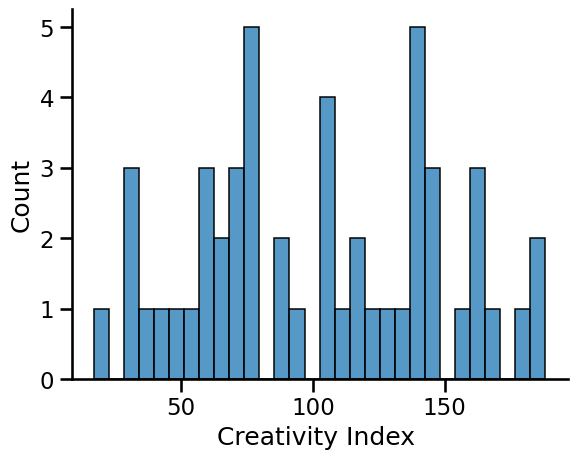

In [138]:
sns.histplot(x=ise['Creativity Index '], bins=30)
sns.despine()

In [139]:
state_joined = compute_state_scores(
    county_agg,
    state_fips,
    sector_trends,
    grouping='fips'
).merge(
    us[['state_code', 'gdp per capita (2017)', 'gini-coefficient']],
    how='left',
    left_on='state_abbr',
    right_on='state_code'
).merge(
    # mega[['State Abbreviation', 'E_1a_occupationArtistic']].rename({'State Abbreviation': 'state_abbr'}, axis=1),
    ise[['State Abbreviation', 'Creativity Index ']].rename({'State Abbreviation': 'state_abbr', 'Creativity Index ': 'creativity'}, axis=1),
    how='left',
    on='state_abbr'
)

In [140]:
state_joined[['aii_scaled', 'gdp per capita (2017)']].corr()

,aii_scaled,gdp per capita (2017)
aii_scaled,1.000000,0.290762
gdp per capita (2017),0.290762,1.000000


In [141]:
state_joined[['aii_scaled', 'gini-coefficient']].corr()

,aii_scaled,gini-coefficient
aii_scaled,1.000000,0.216246
gini-coefficient,0.216246,1.000000


In [142]:
state_joined.sort_values([
    'gini-coefficient',
    'aii_scaled',
]).tail(10)

,fips,aii_normalized,aii_scaled,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name,state_code,gdp per capita (2017),gini-coefficient,creativity
50,34,0.104983,0.144309,New Jersey,NJ,New Jersey NJ,40.0,1.0,2.0,34.0,Northeast,Middle Atlantic,NJ,56472.0,0.4813,158.0
17,21,0.109544,1.057753,Kentucky,KY,Kentucky KY,40.0,3.0,6.0,21.0,South,East South Central,KY,38603.0,0.4813,40.0
3,28,0.101562,-0.540973,Mississippi,MS,Mississippi MS,40.0,3.0,6.0,28.0,South,East South Central,MS,31633.0,0.4828,30.0
30,01,0.105472,0.242172,Alabama,AL,Alabama AL,40.0,3.0,6.0,1.0,South,East South Central,AL,36856.0,0.4847,75.0
16,12,0.100820,-0.689496,Florida,FL,Florida FL,40.0,3.0,5.0,12.0,South,South Atlantic,FL,39093.0,0.4852,131.0
13,06,0.106633,0.474622,California,CA,California CA,40.0,4.0,9.0,6.0,West,Pacific,CA,57328.0,0.4899,184.0
22,09,0.110413,1.231828,Connecticut,CT,Connecticut CT,40.0,1.0,1.0,9.0,Northeast,New England,CT,63747.0,0.4945,167.0
26,22,0.107158,0.579889,Louisiana,LA,Louisiana LA,40.0,3.0,7.0,22.0,South,West South Central,LA,44293.0,0.4990,67.0
7,36,0.108655,0.879733,New York,NY,New York NY,40.0,1.0,2.0,36.0,Northeast,Middle Atlantic,NY,64093.0,0.5229,178.0
44,11,0.089514,-2.953899,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [143]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

temp = state_joined[['state_name', 'aii_scaled', 'gdp per capita (2017)', 'gini-coefficient', 'creativity']].dropna()
mdl = LinearRegression()
mdl.fit(temp[['aii_scaled']], temp['gdp per capita (2017)'])
r2_score(temp['gdp per capita (2017)'], mdl.predict(temp[['aii_scaled']]))

0.08454250293760812

In [144]:
temp[np.abs((temp['gini-coefficient'] - temp['gini-coefficient'].mean()) / temp['gini-coefficient'].std()).ge(2)]

,state_name,aii_scaled,gdp per capita (2017),gini-coefficient,creativity
7,New York,0.879733,64093.0,0.5229,178.0
31,Utah,-0.139700,44204.0,0.4063,104.0
35,Alaska,-0.635161,67705.0,0.4081,72.0


In [145]:
mdl = LinearRegression()
mdl.fit(temp[['aii_scaled']], temp['gini-coefficient'])
y_true = temp['gini-coefficient'].values
y_pred = mdl.predict(temp[['aii_scaled']])

residuals = y_true - y_pred
z_residuals = (residuals - residuals.mean()) / residuals.std()
temp[np.abs(z_residuals) > 2]
# r2_score(temp['gini-coefficient'], mdl.predict(temp[['aii_scaled']]))


,state_name,aii_scaled,gdp per capita (2017),gini-coefficient,creativity
7,New York,0.879733,64093.0,0.5229,178.0
31,Utah,-0.139700,44204.0,0.4063,104.0
35,Alaska,-0.635161,67705.0,0.4081,72.0


/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


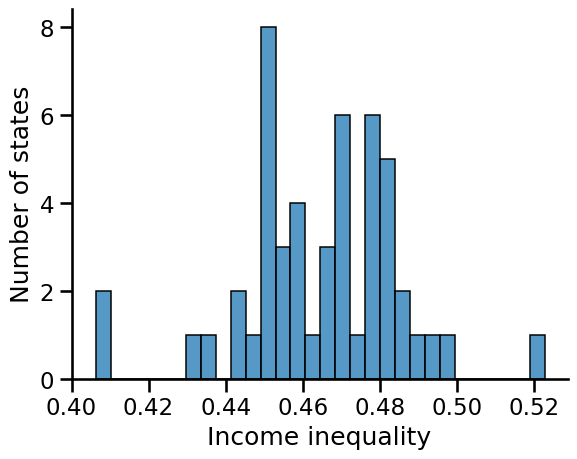

In [146]:
sns.histplot(x=state_joined['gini-coefficient'], bins=30)
plt.xlim(0.4)
plt.xlabel('Income inequality')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/2022/hist-inequality.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


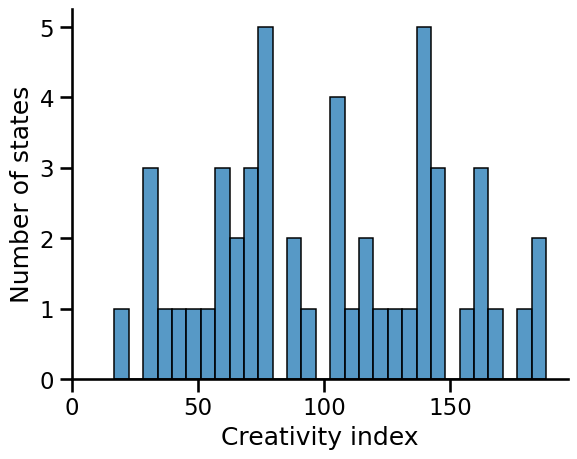

In [147]:
sns.histplot(x=state_joined['creativity'], bins=30)
plt.xlim(0)
plt.xlabel('Creativity index')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/2022/hist-creativity.pdf', bbox_inches='tight')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


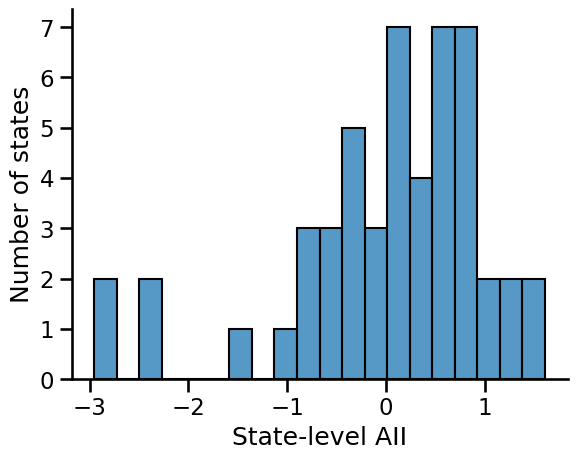

In [148]:
sns.histplot(x=state_joined['aii_scaled'], bins=20)
plt.xlabel('State-level AII')
plt.ylabel('Number of states')
sns.despine()
plt.savefig('figures/2022/hist-aii.pdf', bbox_inches='tight')

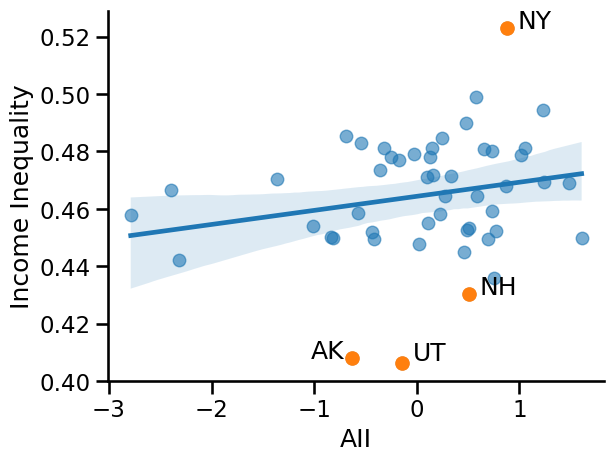

In [149]:
sns.regplot(
    state_joined,
    x='aii_scaled',
    y='gini-coefficient',
    scatter_kws=dict(
        alpha=.6,
    ),
)
outliers = state_joined[state_joined['state_abbr'].isin(['AK', 'UT', 'NH', 'NY'])]
plt.scatter(outliers['aii_scaled'], outliers['gini-coefficient'], c='C1')
for idx, row in outliers.iterrows():
    if row['state_abbr'] == 'AK':
        xy = (row['aii_scaled'] - .4, row['gini-coefficient'])
    elif row['state_abbr'] == 'UT':
        xy = (row['aii_scaled'] + .1, row['gini-coefficient'] + .001)
    else:
        xy = (row['aii_scaled'] + .1, row['gini-coefficient'])
    plt.annotate(row['state_abbr'], xy)
plt.ylim(0.4)
plt.xlabel('AII')
plt.ylabel('Income Inequality')
sns.despine()
plt.savefig('figures/2022/aug-aigi-gini.pdf', bbox_inches='tight')

In [150]:
state_joined[['aii_scaled', 'creativity']].corr()

,aii_scaled,creativity
aii_scaled,1.000000,0.214675
creativity,0.214675,1.000000


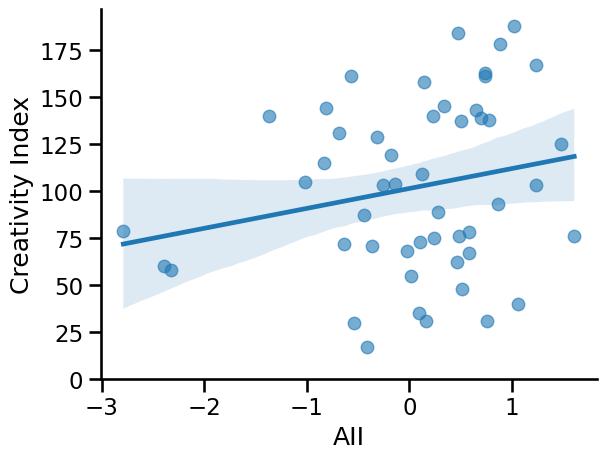

In [152]:
sns.regplot(
    state_joined,
    x='aii_scaled',
    y='creativity',
    scatter_kws=dict(
        alpha=.6,
    ),
)
outliers = state_joined[state_joined['state_abbr'].isin(['AR'])]
# plt.scatter(outliers['aii_scaled'], outliers['creativity'], c='C1')
# for idx, row in outliers.iterrows():
#     xy = (row['aii_scaled'] + .1, row['creativity'])
#     plt.annotate(row['state_abbr'], xy)
plt.ylim(0)
plt.xlabel('AII')
plt.ylabel('Creativity Index')
sns.despine()
plt.savefig('figures/2022/aug-aigi-creative.pdf', bbox_inches='tight')

In [153]:
aigi['fips'] = aigi['area_fips'].str[:2]

In [154]:
pd.merge(
    aigi.groupby('fips').agg({'aii_normalized': 'mean'}).reset_index(),
    state_fips,
    how='left',
    on='fips',
).nlargest(3, 'aii_normalized')

,fips,aii_normalized,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
43,48,0.110939,Texas,TX,Texas TX,40.0,3.0,7.0,48.0,South,West South Central
18,22,0.110452,Louisiana,LA,Louisiana LA,40.0,3.0,7.0,22.0,South,West South Central
38,42,0.109992,Pennsylvania,PA,Pennsylvania PA,40.0,1.0,2.0,42.0,Northeast,Middle Atlantic


In [155]:
pd.merge(
    aigi.groupby('fips').agg({'aii_normalized': 'mean'}).reset_index(),
    state_fips,
    how='left',
    on='fips',
).nsmallest(3, 'aii_normalized')

,fips,aii_normalized,state_name,state_abbr,long_name,sumlev,region,division,state,region_name,division_name
26,30,0.085209,Montana,MT,Montana MT,40.0,4.0,8.0,30.0,West,Mountain
44,49,0.089355,Utah,UT,Utah UT,40.0,4.0,8.0,49.0,West,Mountain
11,15,0.089693,Hawaii,HI,Hawaii HI,40.0,4.0,9.0,15.0,West,Pacific


In [156]:
print(
    pd.DataFrame({
        'Highest scoring': aigi.nlargest(20, 'aii_scaled').title.values,
        'Lowest scoring': aigi.nsmallest(20, 'aii_scaled').title.values,
    })
    .style.to_latex()
)

\begin{tabular}{lll}
 & Highest scoring & Lowest scoring \\
0 & Loving County, Texas & Denali Borough, Alaska \\
1 & Irion County, Texas & Tunica County, Mississippi \\
2 & Shackelford County, Texas & Keweenaw County, Michigan \\
3 & McMullen County, Texas & Gilpin County, Colorado \\
4 & Reagan County, Texas & Garfield County, Utah \\
5 & Dewey County, Oklahoma & Mineral County, Colorado \\
6 & Winkler County, Texas & Lake of the Woods County, Minnesota \\
7 & North Slope Borough, Alaska & Arthur County, Nebraska \\
8 & Upton County, Texas & Moore County, Tennessee \\
9 & Dimmit County, Texas & Mahnomen County, Minnesota \\
10 & Hemphill County, Texas & Stanley County, South Dakota \\
11 & Crane County, Texas & Mackinac County, Michigan \\
12 & Karnes County, Texas & Calhoun County, Illinois \\
13 & Ochiltree County, Texas & Piute County, Utah \\
14 & Claiborne Parish, Louisiana & Loup County, Nebraska \\
15 & Duval County, Texas & McPherson County, Nebraska \\
16 & Jack County, Texas

In [157]:
aigi['is_positive'] = aigi['aii_scaled'].ge(0)

In [192]:
import json

geojson = json.load(open('datasets/geojson-counties-fips.json', 'r'))

In [193]:
import plotly.express as px

fig = px.choropleth(
    # df_county[~df_county['fips'].isin(['72', '78', 'C1', 'C2', 'C3', 'C4', 'US']) & df_county['industry_code'].eq('5191')],
    aigi,
    geojson=geojson, locations='area_fips', color='aii_scaled', scope='usa',
    # color_continuous_scale='PuOr_r',
    # color_continuous_scale=['#5e3c99', '#b2abd2', '#ffffff', '#fdb863', '#e66101'],
    color_continuous_scale=['#4169E1', '#ffffff', '#DC143C'],
    range_color=(-2.5, 2.5),
    width=800
)
# fig = px.choropleth(
#     locations=aigi['state_abbr'],
#     locationmode='USA-states',
#     color=aigi['aii_scaled'],
#     scope='usa',
#     color_continuous_scale='RdBu_r',
#     range_color=(-2.5, 2.5),
#     width=800
# )

fig.update_layout(
    coloraxis_colorbar_x=0.95,
    coloraxis_colorbar=dict(
        title="AII",
    ),
    margin=dict(
        l=0, r=0, t=0, b=0
    ),
)
fig.update_traces(marker_line_width=0.3)
fig.show()
fig.write_image('figures/2022/aug-aigi-counties.pdf')

In [166]:
selected_regions = [
    '53033', # Seattle
    '06085', # Silicon Valley
    '36061', # Manhattan, New York
    '02185', # Alaska
]

In [167]:
(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(selected_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('impacted_workforce')
    )
    .sort('annual_avg_emplvl')
    # .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .pivot(
        index='sector',
        columns='title',
        values='impacted_workforce'
    )
    # .select(
    #     pl.col('title').alias('County'),
    #     pl.col('sector').alias('Most Impacted Sector'),
    #     pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
    # )
    .to_pandas()
    .set_index('sector')
    .fillna(0)
    .style.format('{:.0%}')
)

,"North Slope Borough, Alaska","New York County, New York","King County, Washington","Santa Clara County, California"
sector,,,,
Wholesale trade,0%,3%,4%,3%
Health care and social assistance,0%,11%,12%,14%
Manufacturing,0%,1%,6%,16%
Utilities,0%,0%,0%,0%
Finance and insurance,0%,13%,3%,2%
Information,0%,9%,10%,6%
Transporation and warehousing,0%,1%,1%,1%
"Other services, except public administration",0%,4%,3%,2%
Construction,0%,2%,6%,5%


In [168]:
df_states = pd.DataFrame()
for year in range(2015, 2021):
    df_states = pd.concat([
        df_states,
        compute_state_scores(
            county_agg, state_fips, df_sectors[df_sectors['year'].le(year)]
        ).assign(year=year)
    ], ignore_index=True)
df_states = pd.merge(df_states, area_titles, how='left', on='area_fips')

In [169]:
state_entropy = (
    pl.from_dataframe(state_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('fips').alias('total_emplvl')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emplvl')).alias('pk')
    )
    .with_columns(
        pl.col('pk').mul(pl.col('pk').map_elements(np.log2)).fill_nan(0)
    )
    .group_by('fips')
    .agg(-pl.col('pk').sum())
    .to_pandas()
)

In [170]:
county_entropy = (
    pl.from_dataframe(county_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emplvl')
    )
    .with_columns(
        pl.col('annual_avg_emplvl').truediv(pl.col('total_emplvl')).alias('pk')
    )
    .with_columns(
        pl.col('pk').mul(pl.col('pk').map_elements(np.log2)).fill_nan(0)
    )
    .group_by('area_fips')
    .agg(-pl.col('pk').sum())
    .to_pandas()
)

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/polars/series/series.py:5028: RuntimeWarning:

divide by zero encountered in log2



/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



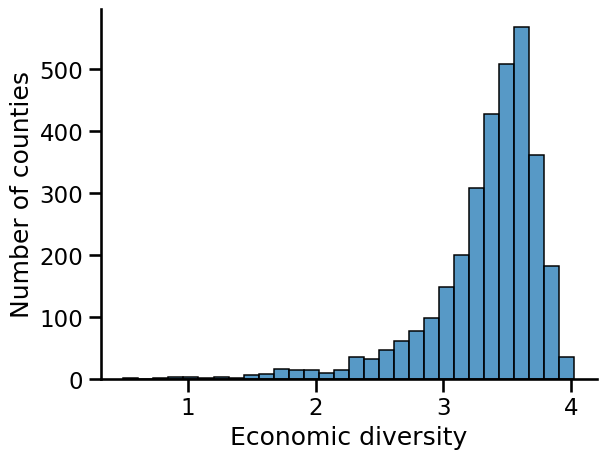

In [171]:
sns.histplot(county_entropy['pk'], bins=30)
plt.xlabel('Economic diversity')
plt.ylabel('Number of counties')
sns.despine()
plt.savefig('figures/2022/hist-entropy.pdf', bbox_inches='tight')

In [172]:
top_regions = aigi.nlargest(20, 'aii_scaled').area_fips.tolist()
bottom_regions = aigi.nsmallest(20, 'aii_scaled').area_fips.tolist()

In [173]:
(
    pl.from_dataframe(county_agg)
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('pk', descending=True)
    .head(20)
    .select(
        pl.col('area_fips'),
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
)

,area_fips,County,Economic Diversity,Most Prevalent Sector
0,08031,"Denver County, Colorado",4.024225,"Professional, Scientific, and Technical Services"
1,41051,"Multnomah County, Oregon",3.992880,Health care and social assistance
2,13121,"Fulton County, Georgia",3.984826,"Professional, Scientific, and Technical Services"
3,49035,"Salt Lake County, Utah",3.984107,Health care and social assistance
4,08123,"Weld County, Colorado",3.981017,Construction
5,48201,"Harris County, Texas",3.980071,Health care and social assistance
6,48113,"Dallas County, Texas",3.979897,"Professional, Scientific, and Technical Services"
7,53033,"King County, Washington",3.976027,Health care and social assistance
8,27037,"Dakota County, Minnesota",3.970370,Retail trade
9,55025,"Dane County, Wisconsin",3.959750,Health care and social assistance


In [175]:
# Table 3 - top
print(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(top_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('aii_scaled', descending=True)
    .select(
        # pl.col('area_fips'),
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
    .style.format({'Economic Diversity': '{:.2f}'})
    .to_latex()
)

\begin{tabular}{llrl}
 & County & Economic Diversity & Most Prevalent Sector \\
0 & Loving County, Texas & 1.05 & Mining \\
1 & Irion County, Texas & 1.66 & Mining \\
2 & Shackelford County, Texas & 2.02 & Mining \\
3 & McMullen County, Texas & 1.73 & Mining \\
4 & Reagan County, Texas & 1.88 & Mining \\
5 & Dewey County, Oklahoma & 2.56 & Mining \\
6 & Winkler County, Texas & 2.33 & Mining \\
7 & North Slope Borough, Alaska & 2.22 & Mining \\
8 & Upton County, Texas & 2.11 & Mining \\
9 & Dimmit County, Texas & 2.73 & Mining \\
10 & Hemphill County, Texas & 2.98 & Mining \\
11 & Crane County, Texas & 2.91 & Mining \\
12 & Karnes County, Texas & 3.19 & Mining \\
13 & Ochiltree County, Texas & 3.14 & Mining \\
14 & Claiborne Parish, Louisiana & 3.03 & Mining \\
15 & Duval County, Texas & 2.47 & Health care and social assistance \\
16 & Jack County, Texas & 3.05 & Mining \\
17 & Glasscock County, Texas & 1.60 & Agriculture, forestry, fishing and hunting \\
18 & Hockley County, Texas & 3.

In [176]:
# Table 3 - bottom
print(
    pl.from_dataframe(county_agg)
    .filter(pl.col('area_fips').is_in(bottom_regions))
    .with_columns(
        pl.col('annual_avg_emplvl').sum().over('area_fips').alias('total_emp')
    )
    .sort('annual_avg_emplvl')
    .group_by('area_fips').tail(1)
    .join(pl.from_dataframe(aigi), on='area_fips')
    .join(pl.from_dataframe(county_entropy), on='area_fips')
    .sort('aii_scaled', descending=False)
    .select(
        pl.col('title').alias('County'),
        # pl.col('annual_avg_emplvl').truediv(pl.col('total_emp')).alias('Impacted Workforce'),
        pl.col('pk').alias('Economic Diversity'),
        pl.col('sector').alias('Most Prevalent Sector'),
    )
    .to_pandas()
    .style.format({'Economic Diversity': '{:.2f}'})
    .to_latex()
)

\begin{tabular}{llrl}
 & County & Economic Diversity & Most Prevalent Sector \\
0 & Denali Borough, Alaska & 1.71 & Accommodation and food services \\
1 & Tunica County, Mississippi & 2.11 & Accommodation and food services \\
2 & Keweenaw County, Michigan & 2.13 & Accommodation and food services \\
3 & Gilpin County, Colorado & 1.95 & Accommodation and food services \\
4 & Garfield County, Utah & 2.40 & Accommodation and food services \\
5 & Mineral County, Colorado & 2.42 & Public administration \\
6 & Lake of the Woods County, Minnesota & 2.57 & Accommodation and food services \\
7 & Arthur County, Nebraska & 1.02 & Education services \\
8 & Moore County, Tennessee & 1.47 & Education services \\
9 & Mahnomen County, Minnesota & 2.28 & Accommodation and food services \\
10 & Stanley County, South Dakota & 2.63 & Accommodation and food services \\
11 & Mackinac County, Michigan & 2.60 & Accommodation and food services \\
12 & Calhoun County, Illinois & 2.29 & Education services \\
13 &

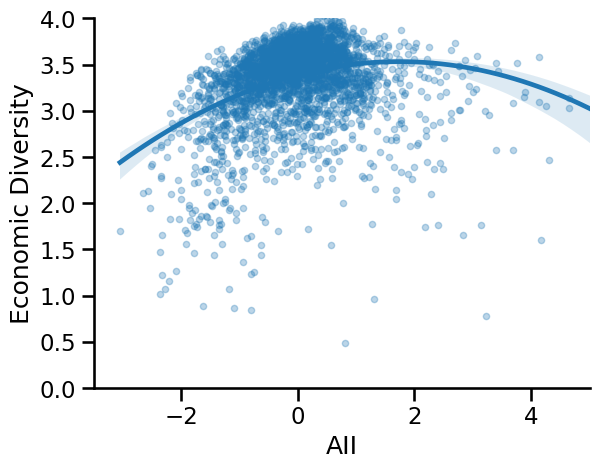

In [177]:
sns.regplot(
    x='aii_scaled',
    y='pk',
    data=pd.merge(
        aigi,
        county_entropy,
        how='left',
        on='area_fips'
    ),
    marker='.',
    scatter_kws=dict(
        alpha=.3
    ),
    order=2,
)
plt.xlim(-3.5, 5)
plt.ylim(0, 4)
plt.xlabel('AII')
plt.ylabel('Economic Diversity')
sns.despine()
plt.savefig('figures/2022/aug-aigi-entropy.pdf', bbox_inches='tight')

In [127]:
threshold = tasks['similarity'].quantile(p_threshold)

def find_most_disrupted_tasks(task_embeddings, abstract_embeddings, tasks, patents):
    assert task_embeddings.shape[0] == tasks.shape[0]
    assert abstract_embeddings.shape[0] == patents.shape[0]

    similarity = cosine_similarity(
        task_embeddings,
        abstract_embeddings
    )

    task_df = tasks.copy()

    patent_map = patents.abstract.reset_index(drop=True).to_dict()
    task_df['similarity'] = similarity.max(axis=1)
    task_df['patent_index'] = similarity.argmax(axis=1)
    task_df['s'] = task_df['similarity'].gt(threshold).astype(int)
    task_df['similarity_t'] = task_df['similarity'] * task_df['s']
    task_df['closest_patent'] = task_df['patent_index'].map(patent_map)
    return task_df

def get_disrupted_tasks_over_time(task_embeddings, abstract_embeddings, tasks, patents, task_ids):
    task_df = pd.DataFrame()
    for year in range(2015, 2021):
        patent_ids = patents[patents['year'].ge(year) & patents['year'].le(year)].index.values
        task_df = pd.concat([
            task_df,
            find_most_disrupted_tasks(
                task_embeddings[task_ids],
                abstract_embeddings[patent_ids],
                tasks.loc[task_ids],
                patents.loc[patent_ids]
            ).assign(year=year)
        ], ignore_index=True)
    return task_df

# Education

In [178]:
edu = pd.read_csv('datasets/db_26_3_text/Education, Training, and Experience.txt', sep='\t')
edu_categories = pd.read_csv('datasets/db_26_3_text/Education, Training, and Experience Categories.txt', sep='\t')

In [179]:
edu_rl = edu.query('`Scale ID` == "RL"').copy()

In [180]:
edu_rl['exp_edu'] = edu_rl['Category'] * edu_rl['Data Value'] / 100

In [181]:
# edu_level = edu_rl.groupby('Title').exp_edu.sum()
edu_level = edu_rl.sort_values(['O*NET-SOC Code', 'Data Value']).groupby('O*NET-SOC Code').tail(1).set_index('O*NET-SOC Code')[['Category']]
edu_level['exp_edu'] = edu_level['Category']
edu_level = edu_level.reset_index()
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby(['SOC Code', 'Category']).agg({'exp_edu': 'mean'}).reset_index()

In [182]:
edu_rl['exp_edu'] = edu_rl['Category'] * edu_rl['Data Value']

In [183]:
edu_level = (
    pl.from_dataframe(edu_rl)
    .filter(pl.col('Data Value') == pl.col('Data Value').max().over('O*NET-SOC Code'))
    .select('O*NET-SOC Code', pl.col('Category').alias('exp_edu'))
    .to_pandas()
)
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby('SOC Code').exp_edu.max().reset_index()

In [184]:
edu_level = (edu_rl.groupby('O*NET-SOC Code').agg({'exp_edu': 'sum'}) / 100).reset_index()
edu_level['SOC Code'] = edu_level['O*NET-SOC Code'].str[:7]
edu_level = edu_level.groupby('SOC Code').exp_edu.mean().reset_index()
edu_level['edu_group'] = pd.cut(edu_level['exp_edu'], [0, 1, 3, 5, 7, 13]).cat.codes

In [185]:
ai_edu = pd.merge(
    data,
    edu_level,
    how='left',
    on='SOC Code'
)

In [186]:
ai_edu['edu_group'].value_counts()

edu_group
1.0    239
2.0    154
3.0    125
4.0    108
Name: count, dtype: int64

In [187]:
sns.set_context('talk')

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



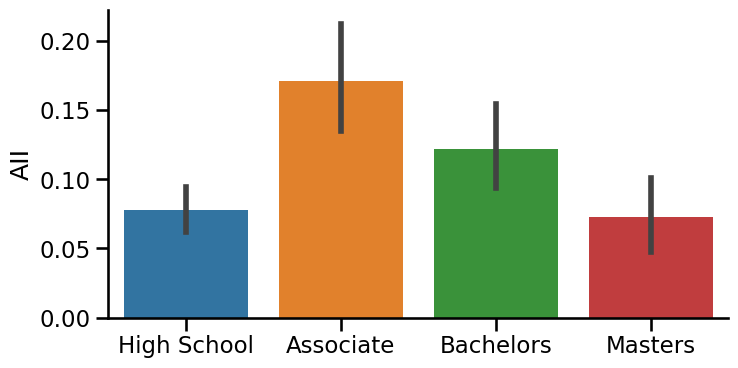

In [188]:
# Figure 1
fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(
    x='edu_group',
    y='aii',
    data=ai_edu
)
plt.xticks(range(4), ['High School', 'Associate', 'Bachelors', 'Masters'])
plt.xlabel('')
plt.ylabel('AII')
sns.despine()
plt.savefig('figures/2022/aug-education.pdf', bbox_inches='tight')

In [532]:
ai_edu[['aii', 'exp_edu']].corr()

,aii,exp_edu
aii,1.000000,0.061686
exp_edu,0.061686,1.000000


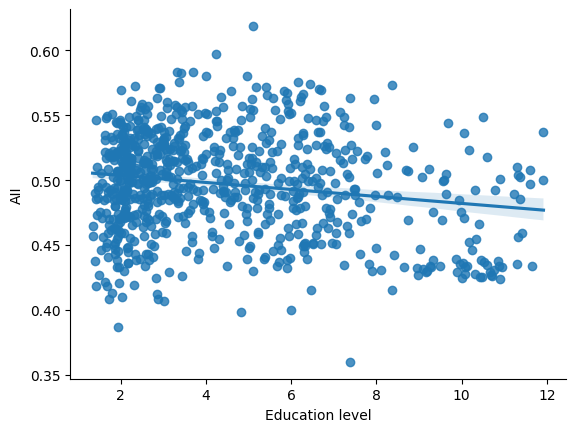

In [ ]:
sns.regplot(
    x='exp_edu',
    y='aii',
    data=ai_edu
)
plt.ylabel('AII')
plt.xlabel('Education level')
sns.despine()

In [ ]:
from scipy.stats import pearsonr

pearsonr(*ai_edu[['aii', 'exp_edu']].dropna().values.T)

PearsonRResult(statistic=-0.09587254267721623, pvalue=0.0028419729957793243)

# Tech Skills

In [44]:
tech = pd.read_csv('datasets/db_24_3_text/Technology Skills.txt', sep='\t')

In [45]:
tech.sample(10, random_state=42)[['O*NET-SOC Code', 'Example', 'Commodity Title']]

,O*NET-SOC Code,Example,Commodity Title
28308,51-6061.00,Microsoft PowerPoint,Presentation software
20985,29-1069.12,Epic Practice Management,Medical software
12358,17-2141.02,1CadCam Unigraphics,Computer aided manufacturing CAM software
22809,33-9011.00,Web browser software,Internet browser software
8309,15-1151.00,Atlassian JIRA,Content workflow software
17990,25-1082.00,Emerald Insight Emerald Management Xtra,Library software
15409,19-2043.00,Scientific Software Group MODFLOWT,Analytical or scientific software
12086,17-2112.00,Supply chain capacity planning software,Materials requirements planning logistics and ...
8674,15-1199.01,Apache Cassandra,Data base management system software
28510,51-8093.00,Microsoft Excel,Spreadsheet software


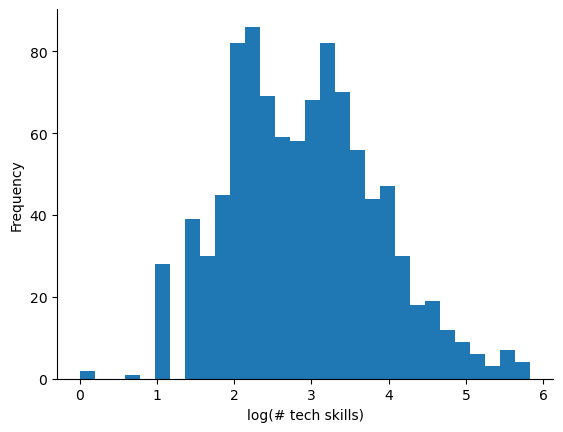

In [46]:
tech.groupby('O*NET-SOC Code').size().apply(np.log).plot.hist(bins=30)
plt.xlabel('log(# tech skills)')
sns.despine()

In [48]:
jobs_tech = (
    pl.from_dataframe(data)
    .join(
        (
            pl.from_dataframe(tech)
            .group_by('O*NET-SOC Code')
            .agg(pl.count('Hot Technology').alias('tech'))
            .with_columns(pl.col('O*NET-SOC Code').str.slice(0, length=7).alias('SOC Code'))
            .group_by('SOC Code')
            .agg(pl.col('tech').mean())
            .with_columns(pl.col('tech').log().alias('log_tech'))
        ),
        how='left',
        on='SOC Code'
    )
    .to_pandas()
    .dropna()
)

In [49]:
jobs_tech[['aii','log_tech']].corr()

,aii,log_tech
aii,1.000000,0.112402
log_tech,0.112402,1.000000


In [56]:
jobs_tech['decile'] = pd.qcut(jobs_tech['log_tech'], q=10).cat.codes

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


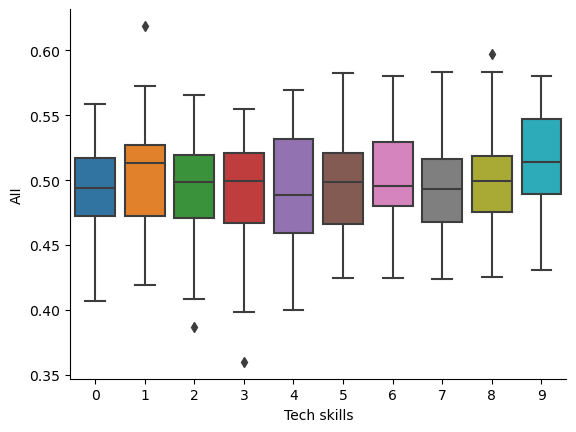

In [57]:
sns.boxplot(
    x='decile',
    y='aii',
    data=jobs_tech
)
plt.xlabel('Tech skills')
plt.ylabel('AII')
sns.despine()

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


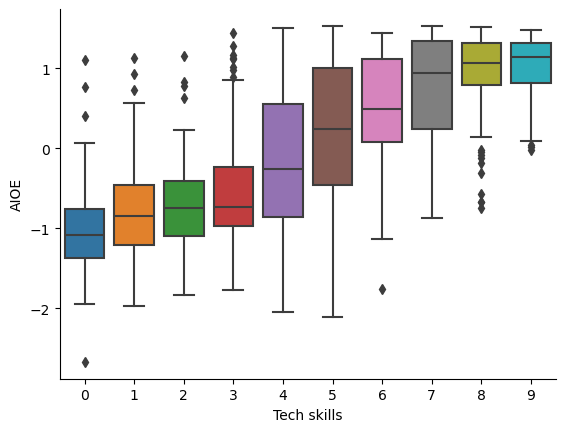

In [59]:
sns.boxplot(
    x='decile',
    y='aioe',
    data=jobs_tech
)
plt.xlabel('Tech skills')
plt.ylabel('AIOE')
sns.despine()

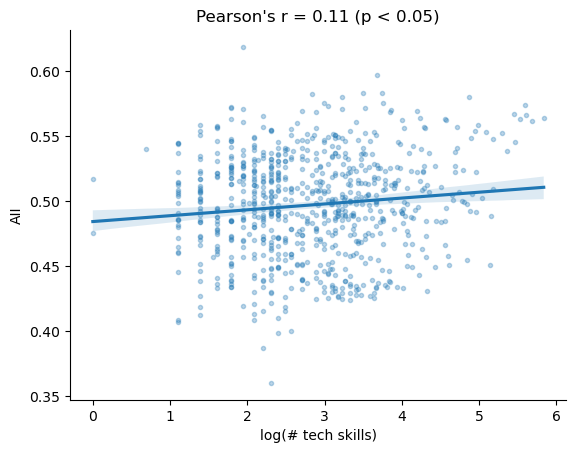

In [50]:
from scipy.stats import pearsonr

rho, pval = pearsonr(jobs_tech['aii'], jobs_tech['log_tech'])

sns.regplot(
    x='log_tech',
    y='aii',
    data=jobs_tech,
    marker='.',
    scatter_kws={'alpha': .3}
)
plt.title(f"Pearson's r = {rho:.2f} (p < 0.05)")
plt.xlabel('log(# tech skills)')
plt.ylabel('AII')
sns.despine()

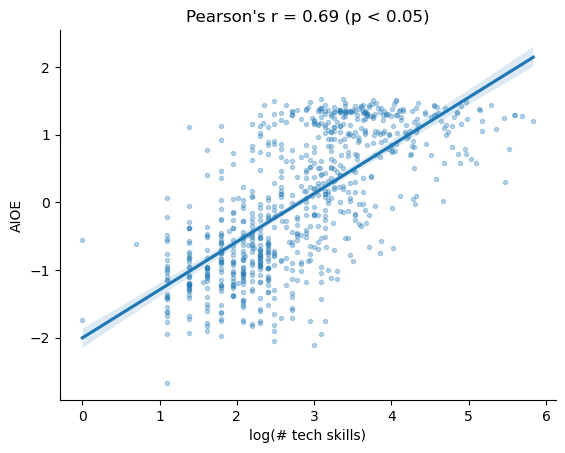

In [51]:
rho, pval = pearsonr(jobs_tech['aioe'], jobs_tech['log_tech'])

sns.regplot(
    x='log_tech',
    y='aioe',
    data=jobs_tech,
    marker='.',
    scatter_kws={'alpha': .3}
)
plt.title(f"Pearson's r = {rho:.2f} (p < 0.05)")
plt.xlabel('log(# tech skills)')
plt.ylabel('AIOE')
sns.despine()

# Salary

In [215]:
salary = pd.read_excel('datasets/national_M2022_dl.xlsx')

In [216]:
salary.columns

Index(['AREA', 'AREA_TITLE', 'AREA_TYPE', 'PRIM_STATE', 'NAICS', 'NAICS_TITLE',
       'I_GROUP', 'OWN_CODE', 'OCC_CODE', 'OCC_TITLE', 'O_GROUP', 'TOT_EMP',
       'EMP_PRSE', 'JOBS_1000', 'LOC_QUOTIENT', 'PCT_TOTAL', 'H_MEAN',
       'A_MEAN', 'MEAN_PRSE', 'H_PCT10', 'H_PCT25', 'H_MEDIAN', 'H_PCT75',
       'H_PCT90', 'A_PCT10', 'A_PCT25', 'A_MEDIAN', 'A_PCT75', 'A_PCT90',
       'ANNUAL', 'HOURLY'],
      dtype='object')

In [255]:
salary_df = pd.merge(
    data,
    salary[['OCC_CODE', 'H_MEDIAN', 'A_MEDIAN']],
    how='left',
    left_on='SOC Code',
    right_on='OCC_CODE'
)
salary_df['h_median'] = salary_df['H_MEDIAN'].replace('*', np.nan).replace('#', np.nan).astype(float)
salary_df['a_median'] = salary_df['A_MEDIAN'].replace('*', np.nan).replace('#', np.nan).astype(float)
salary_df['log_salary'] = salary_df['a_median'].apply(np.log)
salary_df = salary_df.dropna(subset='log_salary')

In [256]:
salary_df['decile'] = pd.qcut(salary_df['a_median'], q=10).cat.codes
salary_df['percentile'] = pd.qcut(salary_df['a_median'], q=100).cat.codes

In [267]:
salary_df['z_aii'] = (salary_df['aii'] - salary_df['aii'].mean()) / salary_df['aii'].std()

In [270]:
salary_df['aii'].eq(0).mean()

0.35

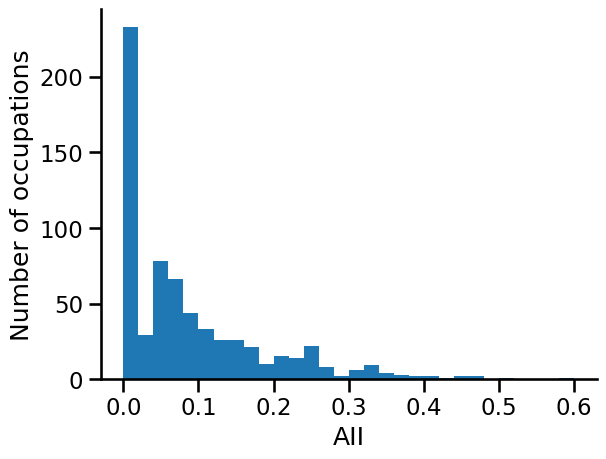

In [265]:
plt.hist(x=salary_df['aii'], bins=30)
plt.xlabel('AII')
plt.ylabel('Number of occupations')
sns.despine()

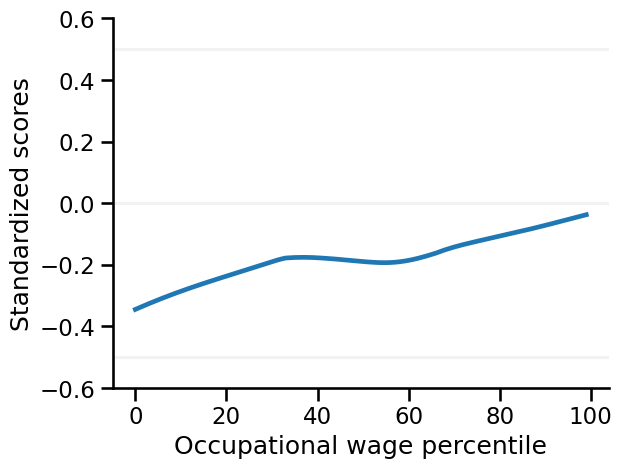

In [253]:
sns.regplot(
    x='percentile',
    y='aii',
    data=salary_df,
    lowess=True,
    scatter=False
)
plt.xlabel('Occupational wage percentile')
plt.ylabel('Standardized scores')
plt.axhline(0.5, linestyle='-', c='grey', alpha=.1)
plt.axhline(0, linestyle='-', c='grey', alpha=.1)
plt.axhline(-0.5, linestyle='-', c='grey', alpha=.1)
plt.ylim(-.6, .6)
sns.despine()

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead

/Users/aliakbars/miniforge3/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead



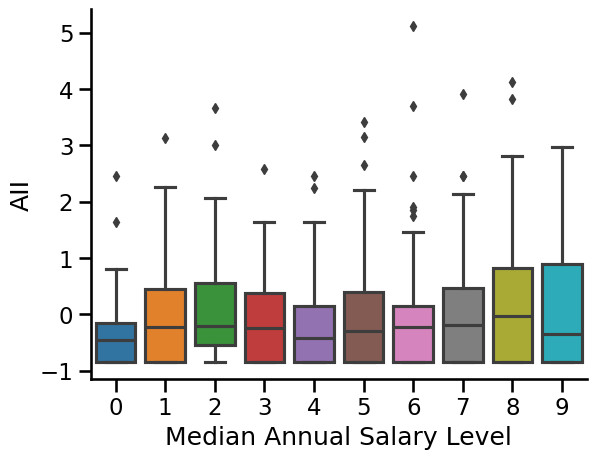

In [227]:
sns.boxplot(
    x='decile',
    y='aii',
    data=salary_df
)
plt.xlabel('Median Annual Salary Level')
plt.ylabel('AII')
sns.despine()

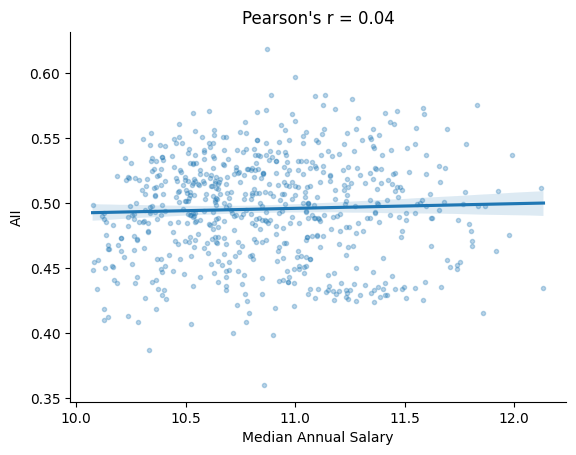

In [740]:
rho, pval = pearsonr(salary_df['aii'], salary_df['log_salary'])

sns.regplot(
    x='log_salary',
    y='aii',
    data=salary_df,
    marker='.',
    scatter_kws={'alpha': .3}
)
plt.title(f"Pearson's r = {rho:.2f}")
plt.xlabel('Median Annual Salary')
plt.ylabel('AII')
sns.despine()

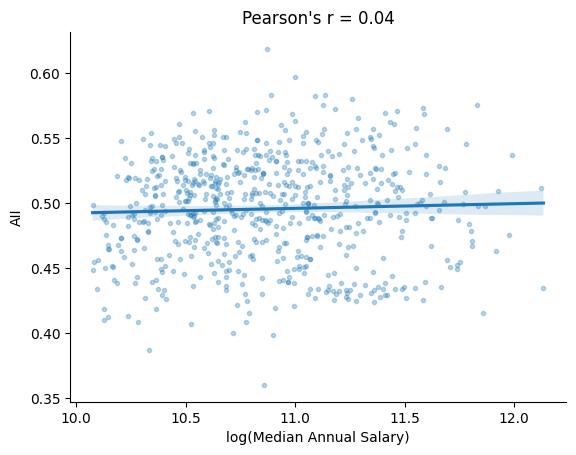

In [742]:
rho, pval = pearsonr(salary_df['aii'], salary_df['log_salary'])

sns.regplot(
    x='log_salary',
    y='aii',
    data=salary_df,
    marker='.',
    scatter_kws={'alpha': .3}
)
plt.title(f"Pearson's r = {rho:.2f}")
plt.xlabel('log(Median Annual Salary)')
plt.ylabel('AII')
sns.despine()